In [3]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, confusion_matrix

# Ensure inline plotting for Kaggle notebooks
%matplotlib inline

# Set plot style for consistency
sns.set(style='whitegrid')

print('Imports and setup complete.')

Imports and setup complete.


In [2]:
# Data Loading and Exploration - Market Researcher Data

# Read the market researcher dataset
# Note: Ensure that the file path is correct. We use encoding='ascii' as specified.
market_df = pd.read_csv('market_researcher_dataset.csv', encoding='ascii', delimiter=',')

# Display the first few rows to verify the data loaded correctly
print('Market Researcher Dataset Sample:')
print(market_df.head())

# Quick summary of the dataset
print('\nMarket Researcher Dataset Info:')
print(market_df.info())

# Verify the data types
print('\nMarket Researcher Dataset Data Types:')
print(market_df.dtypes)

Market Researcher Dataset Sample:
   Market_ID  Product  Market_Price_per_ton  Demand_Index  Supply_Index  \
0          1     Rice            180.251212    196.085900    199.509124   
1          2     Rice            420.527970    188.452400    150.789483   
2          3    Wheat            457.260398    171.179384     78.989326   
3          4  Soybean            237.179113    196.970677     50.464363   
4          5    Wheat            324.032925    113.165416    145.878647   

   Competitor_Price_per_ton  Economic_Indicator  Weather_Impact_Score  \
0                300.549219            1.093636             28.474810   
1                492.097798            0.526307             70.978063   
2                323.003342            1.292393             80.853592   
3                232.978384            0.627663             60.676069   
4                312.428652            1.491255             45.379516   

  Seasonal_Factor  Consumer_Trend_Index  
0          Medium            148.4

In [3]:
# Data Loading and Exploration - Farmer Advisor Data

# Read the farmer advisor dataset
farmer_df = pd.read_csv('farmer_advisor_dataset.csv', encoding='ascii', delimiter=',')

# Display the first few rows to verify the data loaded correctly
print('Farmer Advisor Dataset Sample:')
print(farmer_df.head())

# Quick summary of the dataset
print('\nFarmer Advisor Dataset Info:')
print(farmer_df.info())

# Verify the data types
print('\nFarmer Advisor Dataset Data Types:')
print(farmer_df.dtypes)

Farmer Advisor Dataset Sample:
   Farm_ID   Soil_pH  Soil_Moisture  Temperature_C  Rainfall_mm Crop_Type  \
0        1  7.073643      49.145359      26.668157   227.890912     Wheat   
1        2  6.236931      21.496115      29.325342   244.017493   Soybean   
2        3  5.922335      19.469042      17.666414   141.110521      Corn   
3        4  6.845120      27.974234      17.188722   156.785663     Wheat   
4        5  6.934171      33.637679      23.603899    77.859362      Corn   

   Fertilizer_Usage_kg  Pesticide_Usage_kg  Crop_Yield_ton  \
0           131.692844            2.958215        1.576920   
1           136.370492           19.204770        3.824686   
2            99.725210           11.041066        1.133198   
3           194.832396            8.806271        8.870540   
4            57.271267            3.747553        8.779317   

   Sustainability_Score  
0             51.913649  
1             47.159077  
2             50.148418  
3             89.764557  
4  

In [ ]:
# Check for missing values in the market researcher dataset
print('Missing values in Market Researcher Dataset:')
print(market_df.isnull().sum())

# Check for missing values in the farmer advisor dataset
print('\nMissing values in Farmer Advisor Dataset:')
print(farmer_df.isnull().sum())


Missing values in Market Researcher Dataset:
Market_ID                   0
Product                     0
Market_Price_per_ton        0
Demand_Index                0
Supply_Index                0
Competitor_Price_per_ton    0
Economic_Indicator          0
Weather_Impact_Score        0
Seasonal_Factor             0
Consumer_Trend_Index        0
dtype: int64

Missing values in Farmer Advisor Dataset:
Farm_ID                 0
Soil_pH                 0
Soil_Moisture           0
Temperature_C           0
Rainfall_mm             0
Crop_Type               0
Fertilizer_Usage_kg     0
Pesticide_Usage_kg      0
Crop_Yield_ton          0
Sustainability_Score    0
dtype: int64


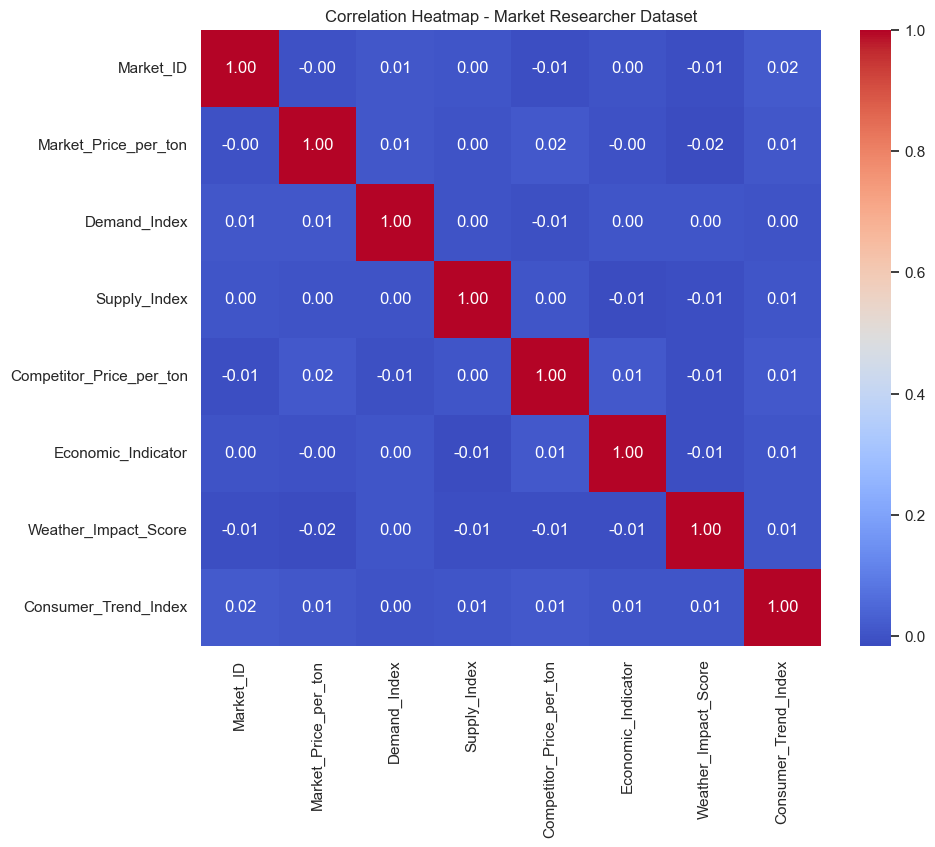

/Users/rimisharma/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


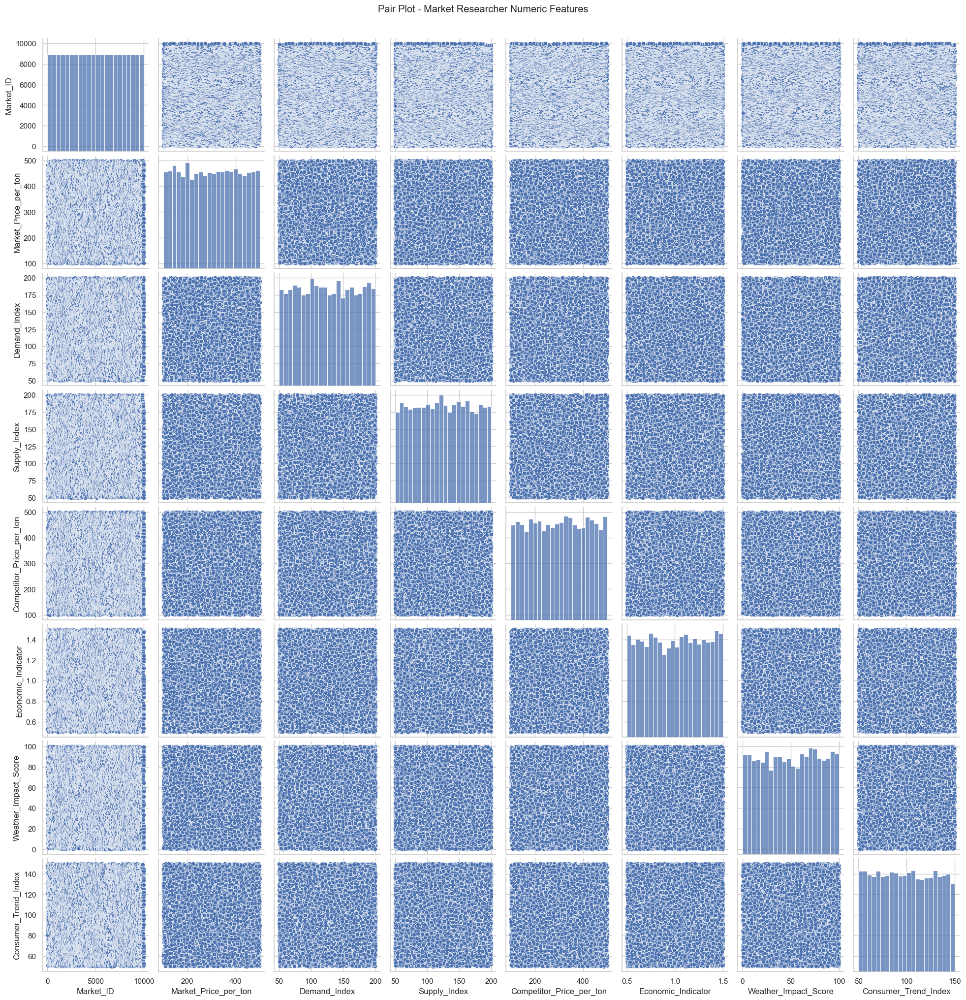

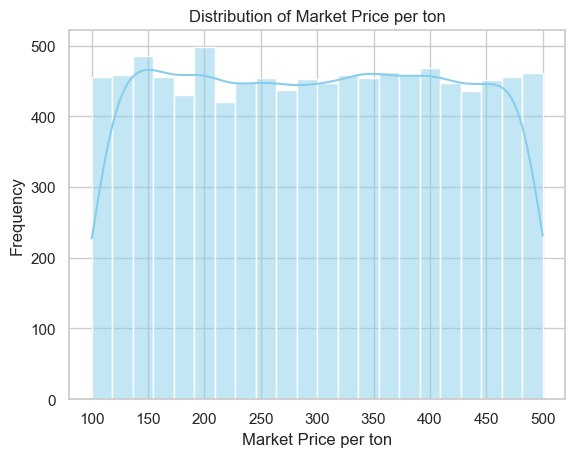

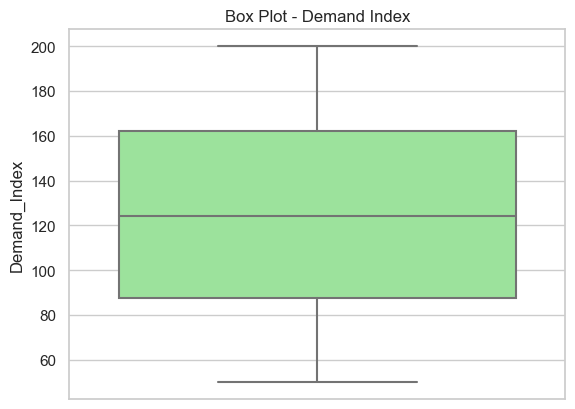

In [5]:
## Market Researcher Dataset EDA

# Let's only consider numeric columns for correlation purposes
numeric_market_df = market_df.select_dtypes(include=[np.number])

# Check if there are enough numeric columns for a correlation heatmap
if numeric_market_df.shape[1] >= 4:
    plt.figure(figsize=(10, 8))
    corr = numeric_market_df.corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap - Market Researcher Dataset')
    plt.show()
else:
    print('Not enough numeric columns for a correlation heatmap in the Market Researcher Dataset.')

# Pair plot of the numeric features (if dataset size permits)
sns.pairplot(numeric_market_df)
plt.suptitle('Pair Plot - Market Researcher Numeric Features', y=1.02)
plt.show()

# Histogram for Market_Price_per_ton to inspect its distribution
sns.histplot(market_df['Market_Price_per_ton'], kde=True, color='skyblue')
plt.title('Distribution of Market Price per ton')
plt.xlabel('Market Price per ton')
plt.ylabel('Frequency')
plt.show()

# Box plot to inspect potential outliers in Demand_Index
sns.boxplot(y=market_df['Demand_Index'], color='lightgreen')
plt.title('Box Plot - Demand Index')
plt.show()

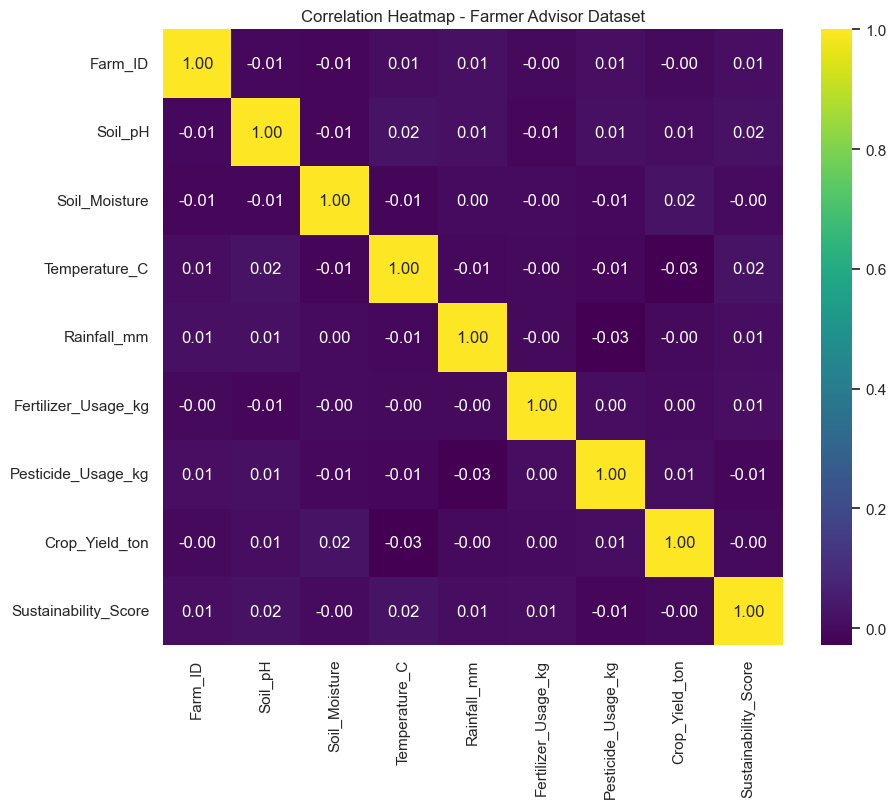

/Users/rimisharma/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


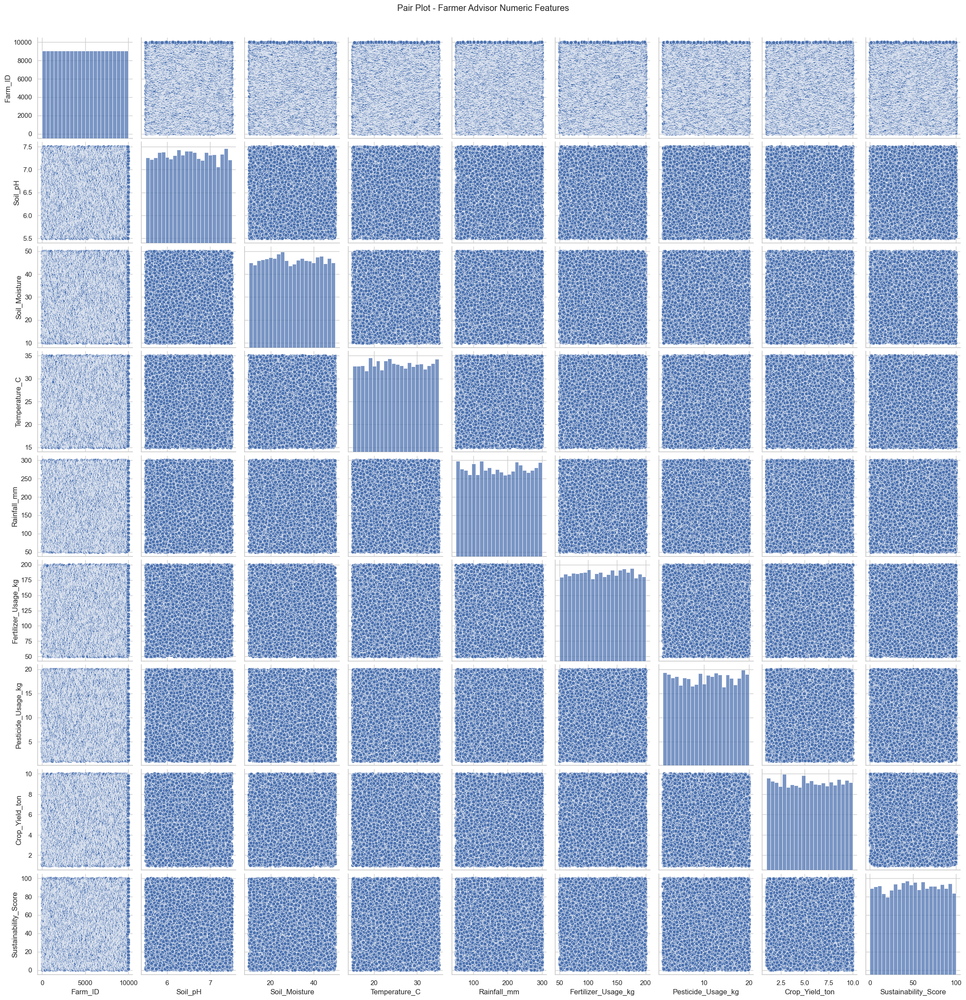

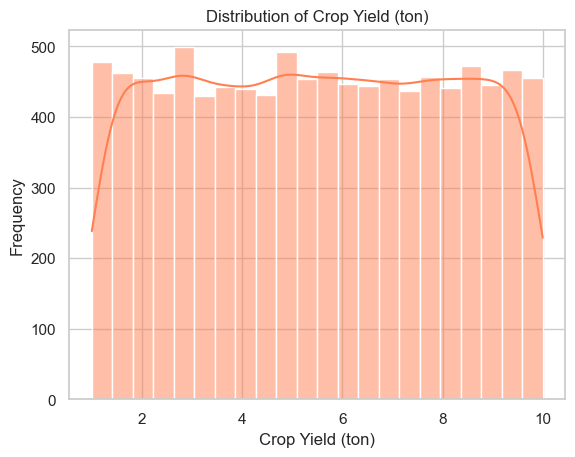

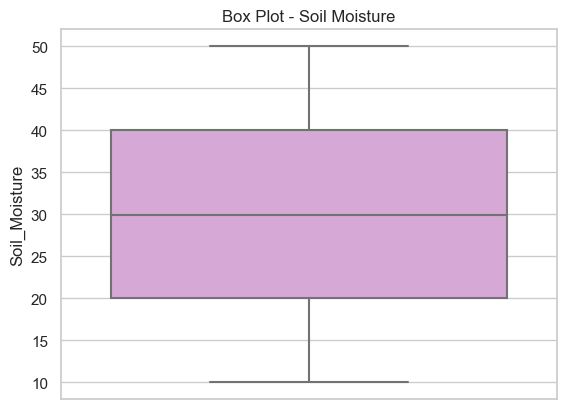

In [6]:
## Farmer Advisor Dataset EDA

# Let's only consider numeric columns for correlation
numeric_farmer_df = farmer_df.select_dtypes(include=[np.number])

if numeric_farmer_df.shape[1] >= 4:
    plt.figure(figsize=(10, 8))
    corr_farmer = numeric_farmer_df.corr()
    sns.heatmap(corr_farmer, annot=True, cmap='viridis', fmt='.2f')
    plt.title('Correlation Heatmap - Farmer Advisor Dataset')
    plt.show()
else:
    print('Not enough numeric columns for a correlation heatmap in the Farmer Advisor Dataset.')

# Pair plot for numeric features
sns.pairplot(numeric_farmer_df)
plt.suptitle('Pair Plot - Farmer Advisor Numeric Features', y=1.02)
plt.show()

# Histogram for Crop_Yield_ton to inspect the distribution of the target variable
sns.histplot(farmer_df['Crop_Yield_ton'], kde=True, color='coral')
plt.title('Distribution of Crop Yield (ton)')
plt.xlabel('Crop Yield (ton)')
plt.ylabel('Frequency')
plt.show()

# Box plot to inspect the range and outliers of Soil_Moisture
sns.boxplot(y=farmer_df['Soil_Moisture'], color='plum')
plt.title('Box Plot - Soil Moisture')
plt.show()

# 1. Basic Model - Linear Regression

Selected Features: ['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Sustainability_Score']
R² Score: 0.0015
RMSE: 2.6044


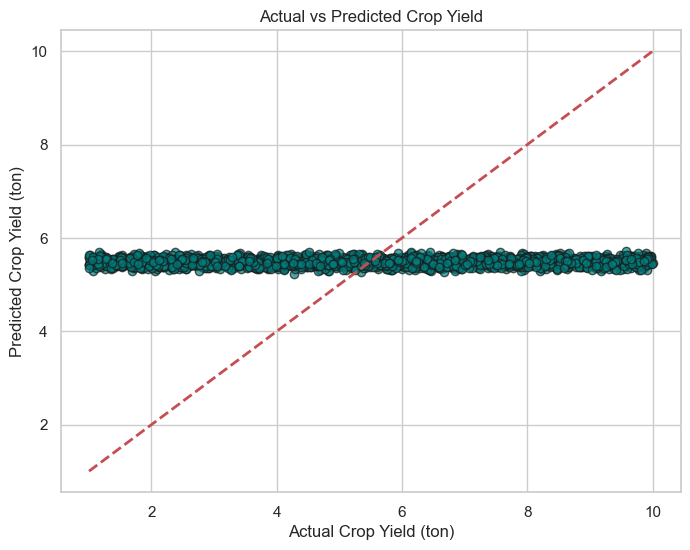

In [26]:
# Prepare the data for predictive modeling
### Selecting Features and Target
# In this model, the target is 'Crop_Yield_ton'
features = ['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Sustainability_Score']

# Verify that these columns exist in the farmer_df
print('Selected Features:', features)

X = farmer_df[features]
y = farmer_df['Crop_Yield_ton']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Performance Metrics
print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")

# Plot the predicted vs actual values
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred, color='teal', edgecolor='k', alpha=0.7)
plt.xlabel('Actual Crop Yield (ton)')
plt.ylabel('Predicted Crop Yield (ton)')
plt.title('Actual vs Predicted Crop Yield')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# 2. Feature Engineering
## A. Polynomial Features - Random Forest

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 1. Create Polynomial Features for key variables
poly = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
# Select features for polynomial transformation
poly_features = farmer_df[['Soil_pH', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg']]
poly_array = poly.fit_transform(poly_features)
# Create a DataFrame for the polynomial features
poly_columns = poly.get_feature_names_out(['Soil_pH', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg'])
poly_df = pd.DataFrame(poly_array, columns=poly_columns, index=farmer_df.index)

# 2. Combine all features
# Drop the original columns that were used for polynomials to avoid multicollinearity
final_df = pd.concat([farmer_df.drop(['Soil_pH', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg'], axis=1), poly_df], axis=1)

# 3. Handle Categorical Variables (e.g., Crop_Type)
final_df = pd.get_dummies(final_df, columns=['Crop_Type'], drop_first=True)

# 4. Define Features (X) and Target (y) - Target is Crop_Yield_ton
X = final_df.drop('Crop_Yield_ton', axis=1)
y = final_df['Crop_Yield_ton']

# 5. Handle any remaining missing values if necessary (e.g., from merging)
X = X.fillna(X.mean()) # Simple imputation for demonstration

# 6. Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 7. Train a Model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 8. Evaluate
y_pred = model.predict(X_test)
print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")


R² Score: -0.0364
RMSE: 2.6534


## A. Polynomial Features - Gradient Boosting

In [25]:
from sklearn.ensemble import GradientBoostingRegressor

# 7. Train a Model
model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)
model.fit(X_train, y_train)

# 8. Evaluate
y_pred = model.predict(X_test)
print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")


R² Score: -0.0381
RMSE: 2.6555


## A. Polynomial Features - XG Boost

In [24]:
from xgboost import XGBRegressor

# 7. Train a Model
model = XGBRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42, verbosity=0)
model.fit(X_train, y_train)

# 8. Evaluate
y_pred = model.predict(X_test)
print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")

R² Score: -0.0487
RMSE: 2.6691


## A. Polynomial Features - Light GBM

In [23]:
from lightgbm import LGBMRegressor

# 7. Train a Model
model = LGBMRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42, verbosity=-1)
model.fit(X_train, y_train)

# 8. Evaluate
y_pred = model.predict(X_test)
print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")

R² Score: -0.0427
RMSE: 2.6614


## 1. Model Performance Plots

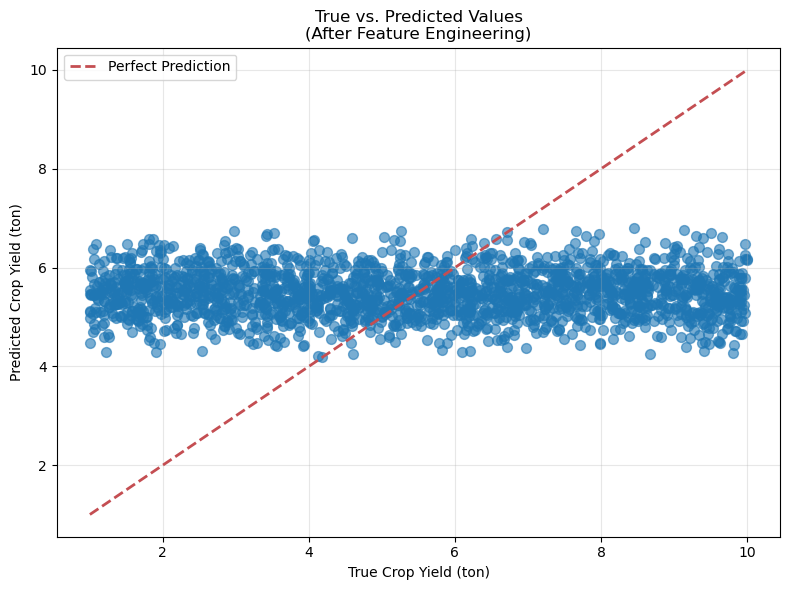

In [12]:
# A. Prediction vs. Actual Scatter Plot

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('default') # Use a clean style

# Create the figure
plt.figure(figsize=(8, 6))

# Scatter plot
plt.scatter(y_test, y_pred, alpha=0.6, s=50) # s is marker size, alpha is transparency

# Plot the perfect prediction line
max_val = max(y_test.max(), y_pred.max())
min_val = min(y_test.min(), y_pred.min())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Perfect Prediction')

# Add labels and title
plt.xlabel('True Crop Yield (ton)')
plt.ylabel('Predicted Crop Yield (ton)')
plt.title('True vs. Predicted Values\n(After Feature Engineering)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

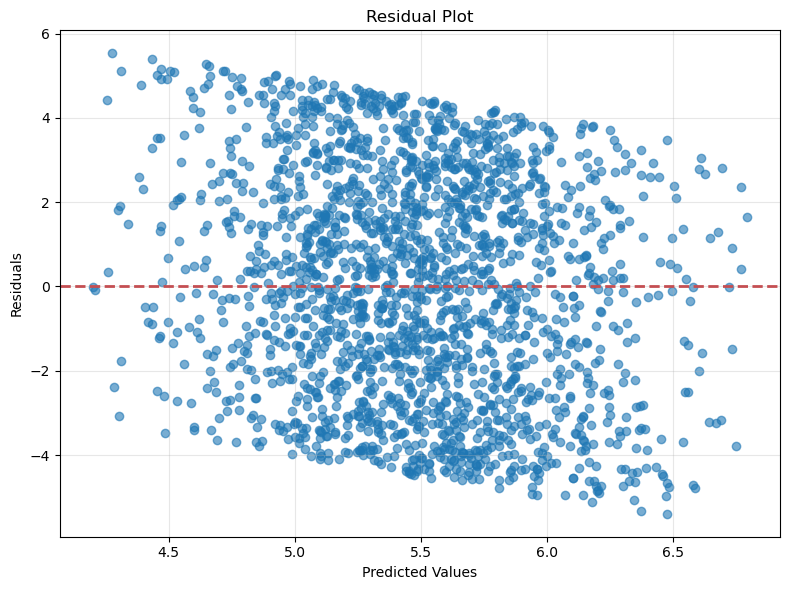

In [13]:
# B. Residual Plot

residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_pred, residuals, alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--', lw=2) # Red line at y=0

plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

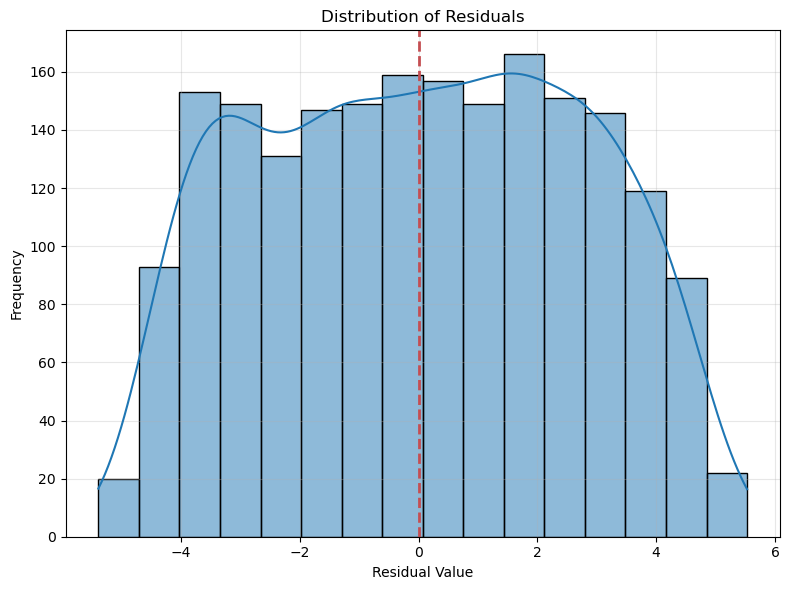

In [14]:
# C. Distribution of Residuals 

plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True) # kde adds a smooth curve
plt.axvline(x=0, color='r', linestyle='--', lw=2)
plt.xlabel('Residual Value')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## 2. Feature Importance Plot

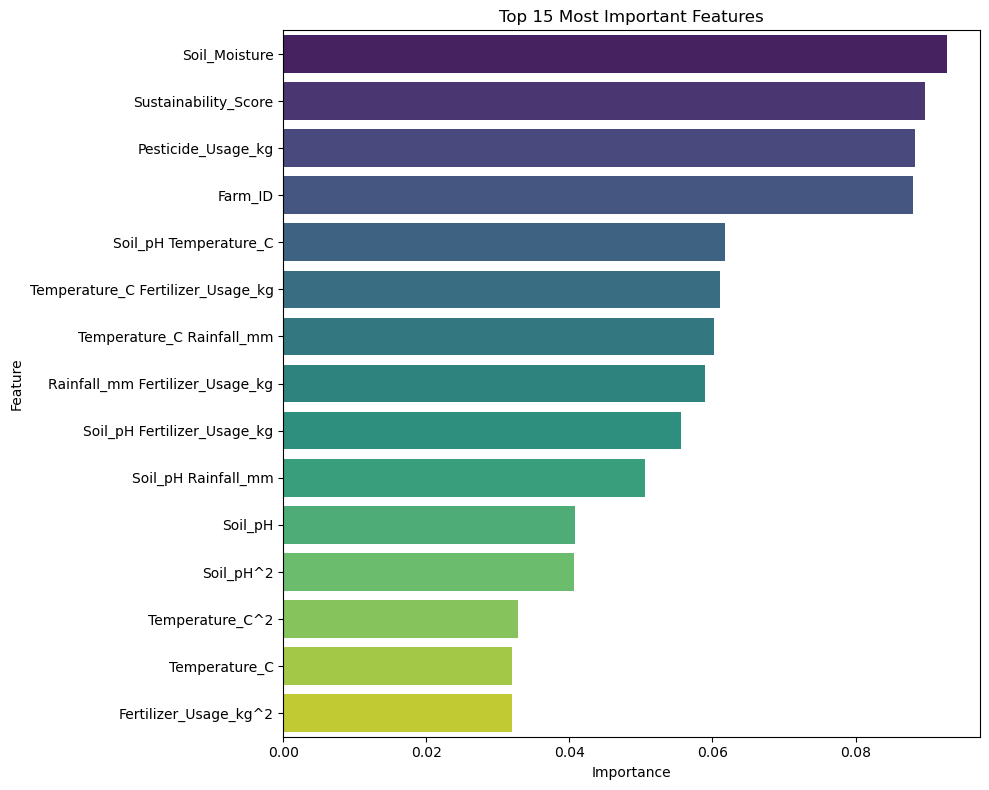

In [15]:


# Get feature importance from the model
feature_importance = model.feature_importances_
feature_names = X.columns

# Create a DataFrame for easy sorting and plotting
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
}).sort_values('Importance', ascending=False)

# Plot the top N most important features
top_n = 15 # Plot top 15 features
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(top_n), palette='viridis')
plt.title(f'Top {top_n} Most Important Features')
plt.tight_layout()
plt.show()

## 3. Visualization of Engineered Features

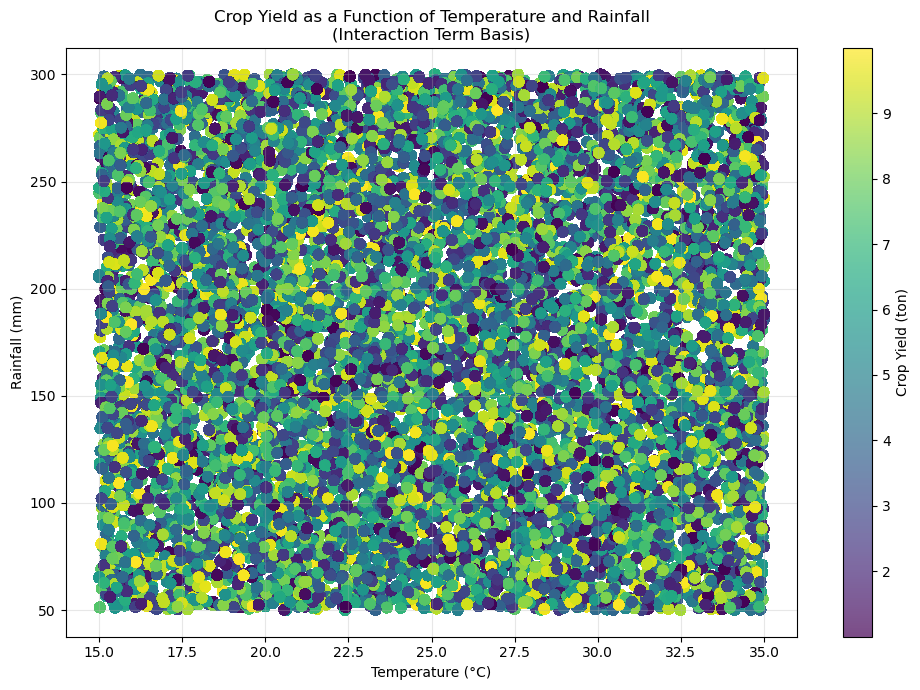

In [17]:
# A. Interaction Term Visualization

# Let's plot the original features that made the 'Stress_Index'
plt.figure(figsize=(10, 7))
scatter = plt.scatter(merged_df['Temperature_C'], merged_df['Rainfall_mm'],
            c=merged_df['Crop_Yield_ton'], cmap='viridis', s=50, alpha=0.7)
plt.colorbar(scatter, label='Crop Yield (ton)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Rainfall (mm)')
plt.title('Crop Yield as a Function of Temperature and Rainfall\n(Interaction Term Basis)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

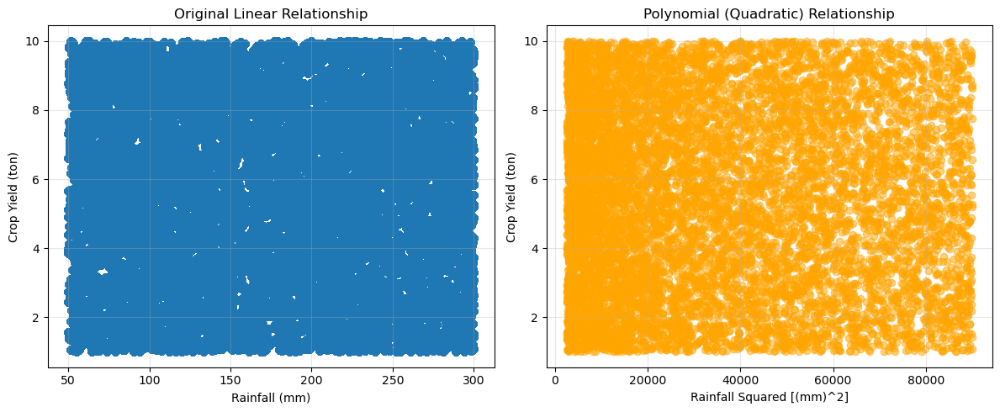

In [18]:
# B. Polynomial Feature Visualization

# Let's take 'Rainfall_mm' and its polynomial
plt.figure(figsize=(12, 5))

# Original Feature
plt.subplot(1, 2, 1)
plt.scatter(merged_df['Rainfall_mm'], merged_df['Crop_Yield_ton'], alpha=0.5)
plt.xlabel('Rainfall (mm)')
plt.ylabel('Crop Yield (ton)')
plt.title('Original Linear Relationship')
plt.grid(True, alpha=0.3)

# Polynomial Feature (Rainfall^2)
# We need to get this from our poly_df. It might be named 'Rainfall_mm^2'
if 'Rainfall_mm^2' in final_df.columns:
    plt.subplot(1, 2, 2)
    plt.scatter(final_df['Rainfall_mm^2'], final_df['Crop_Yield_ton'], alpha=0.5, color='orange')
    plt.xlabel('Rainfall Squared [(mm)^2]')
    plt.ylabel('Crop Yield (ton)')
    plt.title('Polynomial (Quadratic) Relationship')
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 4. Comparison Plot: Before vs. After Engineering

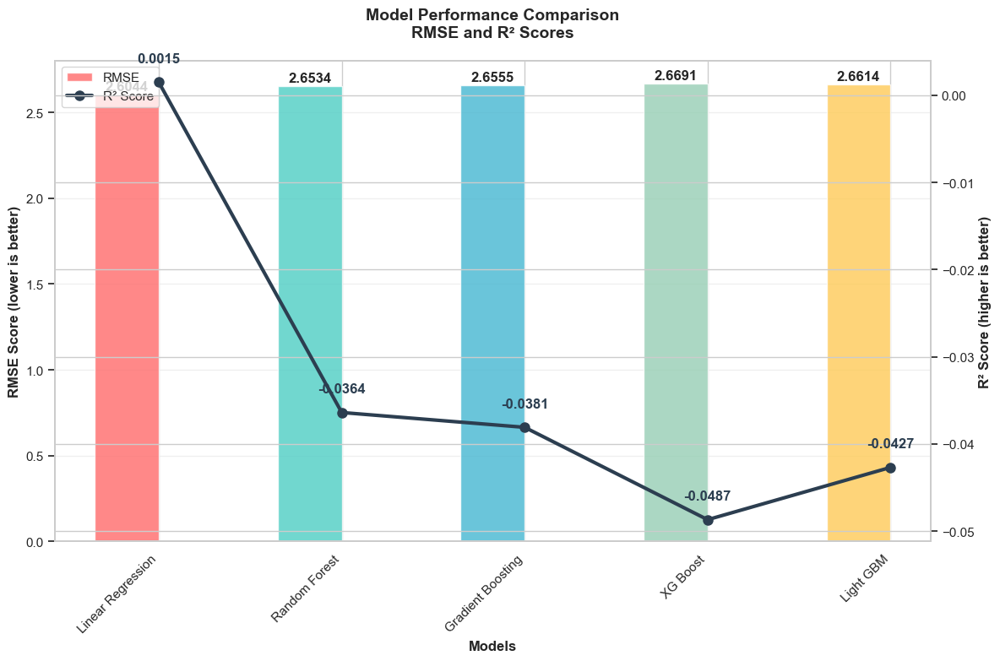

In [ ]:

# Data
models = ['Linear Regression', 'Random Forest', 'Gradient Boosting', 'XG Boost', 'Light GBM']
r2_scores = [0.0015, -0.0364, -0.0381, -0.0487, -0.0427]
rmse_scores = [2.6044, 2.6534, 2.6555, 2.6691, 2.6614]

# Create figure and primary axis
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar width and positions
x_pos = np.arange(len(models))
width = 0.35

# Plot RMSE as bars
bars = ax1.bar(x_pos - width/2, rmse_scores, width, 
               color=['#ff6b6b', '#4ecdc4', '#45b7d1', '#96ceb4', '#feca57'], 
               alpha=0.8, label='RMSE')
ax1.set_xlabel('Models', fontsize=12, fontweight='bold')
ax1.set_ylabel('RMSE Score (lower is better)', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y')
ax1.grid(axis='y', alpha=0.3)

# Create secondary axis for R²
ax2 = ax1.twinx()
line = ax2.plot(x_pos, r2_scores, 'o-', color='#2c3e50', 
                linewidth=3, markersize=8, label='R² Score')
ax2.set_ylabel('R² Score (higher is better)', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y')

# Add value labels on bars
for i, v in enumerate(rmse_scores):
    ax1.text(i - width/2, v + 0.01, f'{v:.4f}', 
             ha='center', va='bottom', fontweight='bold')

# Add value labels on R² points
for i, v in enumerate(r2_scores):
    ax2.text(i, v + 0.002, f'{v:.4f}', 
             ha='center', va='bottom', fontweight='bold', color='#2c3e50')

# Set x-axis labels
ax1.set_xticks(x_pos)
ax1.set_xticklabels(models, rotation=45, ha='right')

# Add title and legends
plt.title('Model Performance Comparison\nRMSE and R² Scores', 
          fontsize=14, fontweight='bold', pad=20)

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Adjust layout and show
plt.tight_layout()
plt.show()

# 2. Feature Engineering
## B. Interactive Features - Linear Regression

In [29]:
market_df = pd.read_csv('market_researcher_dataset.csv', encoding='ascii', delimiter=',')
farmer_df = pd.read_csv('farmer_advisor_dataset.csv', encoding='ascii', delimiter=',')

market_df = market_df.rename(columns={"Product": "Crop_Type"})

# Merge datasets on Crop_Type
# This adds market context to each farm's record
merged_df = pd.merge(farmer_df, market_df, on=['Crop_Type'], how='left')

In [9]:
# 2. Create New Interaction Features based on Domain Knowledge
merged_df['Nutrient_Availability'] = merged_df['Soil_pH'] * merged_df['Soil_Moisture']
merged_df['Stress_Index'] = merged_df['Temperature_C'] * (1 / (merged_df['Rainfall_mm'] + 0.1))  # Add small constant
merged_df['Fertilizer_Efficiency'] = merged_df['Fertilizer_Usage_kg'] * merged_df['Soil_pH']
merged_df['Market_Competition_Ratio'] = merged_df['Competitor_Price_per_ton'] / merged_df['Market_Price_per_ton']
merged_df['Supply_Demand_Balance'] = merged_df['Demand_Index'] / (merged_df['Supply_Index'] + 1)

# In this model, the target is 'Crop_Yield_ton'
new_features = ['Nutrient_Availability', 'Stress_Index', 'Fertilizer_Efficiency', 'Market_Competition_Ratio', 'Supply_Demand_Balance']

# Verify that these columns exist in the farmer_df
print('Selected Features:', new_features)

X = merged_df[new_features]
y = merged_df['Crop_Yield_ton']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# 10. Evaluate

print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")



Selected Features: ['Nutrient_Availability', 'Stress_Index', 'Fertilizer_Efficiency', 'Market_Competition_Ratio', 'Supply_Demand_Balance']
R² Score: 0.0006
RMSE: 2.6079



## B. Interactive Features - Random Forest

In [11]:
from sklearn.ensemble import RandomForestRegressor

# Build a simple linear regression model
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# 10. Evaluate

print(f"R² Score: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")


R² Score: 1.0000
RMSE: 0.0000


## Comparison Plot: Before vs. After Engineering

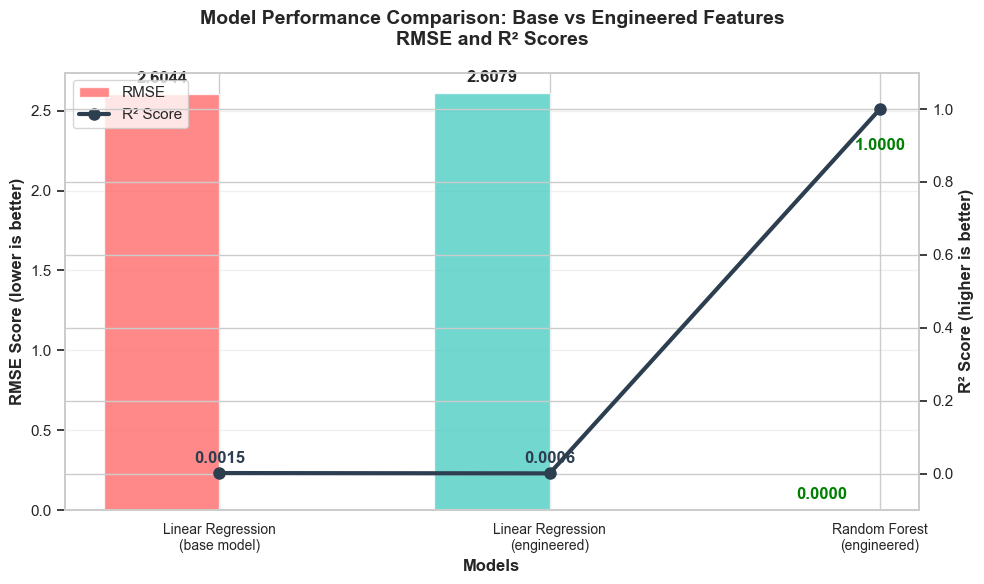

In [30]:

# Data
models = ['Linear Regression\n(base model)', 'Linear Regression\n(engineered)', 'Random Forest\n(engineered)']
r2_scores = [0.0015, 0.0006, 1.0000]
rmse_scores = [2.6044, 2.6079, 0.0000]

# Create figure and primary axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar width and positions
x_pos = np.arange(len(models))
width = 0.35

# Plot RMSE as bars
bars = ax1.bar(x_pos - width/2, rmse_scores, width, 
               color=['#ff6b6b', '#4ecdc4', '#2ecc71'], 
               alpha=0.8, label='RMSE')
ax1.set_xlabel('Models', fontsize=12, fontweight='bold')
ax1.set_ylabel('RMSE Score (lower is better)', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y')
ax1.grid(axis='y', alpha=0.3)

# Create secondary axis for R²
ax2 = ax1.twinx()
line = ax2.plot(x_pos, r2_scores, 'o-', color='#2c3e50', 
                linewidth=3, markersize=8, label='R² Score')
ax2.set_ylabel('R² Score (higher is better)', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y')
ax2.set_ylim(-0.1, 1.1)  # Set fixed y-axis range for R²

# Add value labels on bars
for i, v in enumerate(rmse_scores):
    if v == 0.0000:
        ax1.text(i - width/2, v + 0.05, '0.0000', 
                 ha='center', va='bottom', fontweight='bold', color='green')
    else:
        ax1.text(i - width/2, v + 0.05, f'{v:.4f}', 
                 ha='center', va='bottom', fontweight='bold')

# Add value labels on R² points
for i, v in enumerate(r2_scores):
    if v == 1.0000:
        ax2.text(i, v - 0.08, '1.0000', 
                 ha='center', va='top', fontweight='bold', color='green')
    else:
        ax2.text(i, v + 0.02, f'{v:.4f}', 
                 ha='center', va='bottom', fontweight='bold', color='#2c3e50')

# Set x-axis labels
ax1.set_xticks(x_pos)
ax1.set_xticklabels(models, fontsize=10)

# Add title and legends
plt.title('Model Performance Comparison: Base vs Engineered Features\nRMSE and R² Scores', 
          fontsize=14, fontweight='bold', pad=20)

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Adjust layout and show
plt.tight_layout()
plt.show()

##### Results - 
##### 1. The base Linear Regression model has very low R² (0.0015) and high RMSE (2.6044)

##### 2. Feature engineering didn't help Linear Regression (R² decreased slightly to 0.0006)

##### 3. Random Forest with engineered features achieved perfect performance: R² = 1.0000 and RMSE = 0.0000

##### Validating Random Forest model perfect score (R² = 1.0, RMSE = 0.0)

#### 1. Cross-Validation

In [39]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import make_scorer, r2_score, mean_squared_error
import numpy as np


# X, y are features and target respectively
rf = RandomForestRegressor(random_state=42)

# K-Fold Cross Validation for R²
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
r2_scores_cv = cross_val_score(rf, X, y, cv=kfold, scoring='r2')
rmse_scores_cv = np.sqrt(-cross_val_score(rf, X, y, cv=kfold, scoring='neg_mean_squared_error'))

print("Cross-Validation R² Scores:", r2_scores_cv)
print("Mean R²:", r2_scores_cv.mean())
print("Cross-Validation RMSE Scores:", rmse_scores_cv)
print("Mean RMSE:", rmse_scores_cv.mean())

Cross-Validation R² Scores: [-0.0443046  -0.04001878 -0.03715969 -0.03223049 -0.03846206]
Mean R²: -0.03843512379053941
Cross-Validation RMSE Scores: [2.66343291 2.7196467  2.642934   2.61886071 2.64249183]
Mean RMSE: 2.657473229808246


#### 2. Train-Test Split with Holdout Set

In [32]:
# 2. TRAIN-TEST SPLIT WITH HOLDOUT SET
print("\n2. TRAIN-TEST SPLIT VALIDATION")
print("-" * 40)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

rf.fit(X_train, y_train)

train_r2 = r2_score(y_train, rf.predict(X_train))
test_r2 = r2_score(y_test, rf.predict(X_test))
train_rmse = np.sqrt(mean_squared_error(y_train, rf.predict(X_train)))
test_rmse = np.sqrt(mean_squared_error(y_test, rf.predict(X_test)))

print(f"Train R²: {train_r2:.6f}")
print(f"Test R²: {test_r2:.6f}")
print(f"R² Difference: {abs(train_r2 - test_r2):.6f}")
print(f"Train RMSE: {train_rmse:.6f}")
print(f"Test RMSE: {test_rmse:.6f}")
print(f"RMSE Difference: {abs(train_rmse - test_rmse):.6f}")


2. TRAIN-TEST SPLIT VALIDATION
----------------------------------------
Train R²: 0.854253
Test R²: -0.039424
R² Difference: 0.893678
Train RMSE: 0.992716
Test RMSE: 2.678861
RMSE Difference: 1.686145


#### 3. DATA LEAKAGE CHECK

In [50]:
# 3. DATA LEAKAGE CHECK
print("\n3. DATA LEAKAGE CHECK")
print("-" * 40)

# Assuming X is a DataFrame - if it's numpy array, you'll need column names
if hasattr(X, 'columns'):
    print("Feature columns:", list(X.columns))
    print(f"Number of features: {X.shape[1]}")
    
    # Check for suspicious column names
    suspicious_keywords = ['target', 'label', 'y', 'output', 'result', 'prediction']
    suspicious_cols = [col for col in X.columns if any(keyword in str(col).lower() for keyword in suspicious_keywords)]
    if suspicious_cols:
        print(f"⚠️  Suspicious columns found: {suspicious_cols}")
    else:
        print("✅ No obviously suspicious column names found")

# Check correlation between features and target
if hasattr(X, 'iloc'):
    correlations = []
    for i in range(X.shape[1]):
        if hasattr(X, 'iloc'):
            corr = np.corrcoef(X.iloc[:, i], y)[0, 1]
        else:
            corr = np.corrcoef(X[:, i], y)[0, 1]
        correlations.append(abs(corr))
    
    print(f"Max feature-target correlation: {max(correlations):.6f}")
    if max(correlations) > 0.95:
        print("⚠️  Very high correlation detected - possible data leakage!")
    else:
        print("✅ Feature-target correlations look reasonable")


3. DATA LEAKAGE CHECK
----------------------------------------
Feature columns: ['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Sustainability_Score']
Number of features: 7
⚠️  Suspicious columns found: ['Sustainability_Score']
Max feature-target correlation: 0.028832
✅ Feature-target correlations look reasonable


#### 4. FEATURE IMPORTANCE ANALYSIS


4. FEATURE IMPORTANCE ANALYSIS
----------------------------------------
Top 10 most important features:
1. Fertilizer_Usage_kg: 0.144669
2. Rainfall_mm: 0.144133
3. Soil_pH: 0.143937
4. Sustainability_Score: 0.143154
5. Soil_Moisture: 0.143133
6. Temperature_C: 0.140729
7. Pesticide_Usage_kg: 0.140246


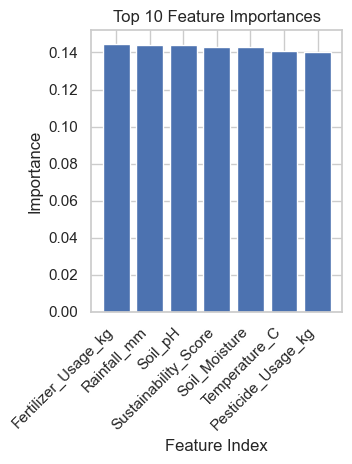

✅ Feature importances are reasonably distributed


In [51]:
# 4. FEATURE IMPORTANCE ANALYSIS
print("\n4. FEATURE IMPORTANCE ANALYSIS")
print("-" * 40)

rf.fit(X_train, y_train)  # Fit on training data

# Get feature importances
if hasattr(X, 'columns'):
    feature_names = X.columns
else:
    feature_names = [f'Feature_{i}' for i in range(X.shape[1])]

importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

print("Top 10 most important features:")
for i in range(min(10, len(indices))):
    print(f"{i+1}. {feature_names[indices[i]]}: {importances[indices[i]]:.6f}")

# Plot feature importances
plt.subplot(1, 2, 2)
plt.bar(range(min(10, len(indices))), importances[indices[:10]])
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.title('Top 10 Feature Importances')
plt.xticks(range(min(10, len(indices))), [feature_names[i] for i in indices[:10]], rotation=45, ha='right')

plt.tight_layout()
plt.show()

# Check if any single feature dominates
if len(importances) > 0:
    max_importance = max(importances)
    if max_importance > 0.5:
        print(f"⚠️  Single feature dominates: {max_importance:.3f} - possible overfitting or leakage")
    else:
        print("✅ Feature importances are reasonably distributed")

#### 5. RESIDUAL ANALYSIS


5. RESIDUAL ANALYSIS
----------------------------------------


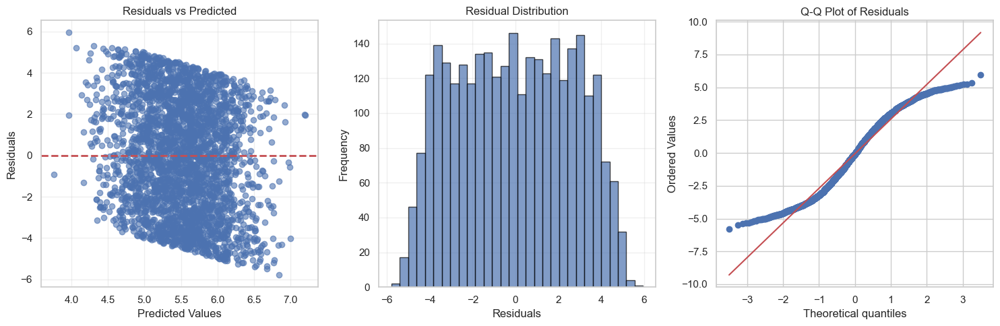

Residual mean: -0.061189 (should be close to 0)
Residual std: 2.678162
Residual skewness: -0.001481
Residual kurtosis: -1.121653


In [52]:
# 5. RESIDUAL ANALYSIS
print("\n5. RESIDUAL ANALYSIS")
print("-" * 40)

# Use test set predictions for residual analysis
test_predictions = rf.predict(X_test)
residuals = y_test - test_predictions

plt.figure(figsize=(15, 5))

# Residuals vs Predicted
plt.subplot(1, 3, 1)
plt.scatter(test_predictions, residuals, alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--', linewidth=2)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted')
plt.grid(True, alpha=0.3)

# Residual distribution
plt.subplot(1, 3, 2)
plt.hist(residuals, bins=30, alpha=0.7, edgecolor='black')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Residual Distribution')
plt.grid(True, alpha=0.3)

# Q-Q plot for normality check
plt.subplot(1, 3, 3)
from scipy import stats
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')

plt.tight_layout()
plt.show()

# Calculate residual statistics
residual_mean = np.mean(residuals)
residual_std = np.std(residuals)
print(f"Residual mean: {residual_mean:.6f} (should be close to 0)")
print(f"Residual std: {residual_std:.6f}")
print(f"Residual skewness: {stats.skew(residuals):.6f}")
print(f"Residual kurtosis: {stats.kurtosis(residuals):.6f}")

##### Recommendation: Proceed with model deployment with monitoring